# 데이터 불러오기

In [1]:
!gdown 1jo-u_wLMZbk6VexNC2mpWMDkOqLxyaga
!unzip -oqq cats_and_dogs.zip

Downloading...
From (original): https://drive.google.com/uc?id=1jo-u_wLMZbk6VexNC2mpWMDkOqLxyaga
From (redirected): https://drive.google.com/uc?id=1jo-u_wLMZbk6VexNC2mpWMDkOqLxyaga&confirm=t&uuid=71b59873-ac73-4f96-a8ad-9f56a4ef7edb
To: /content/cats_and_dogs.zip
100% 90.8M/90.8M [00:01<00:00, 74.9MB/s]


# 재현성 구현

In [2]:
import pandas as pd
import numpy as np
import torch
from tqdm.auto import tqdm
import random
import os
def reset_seeds(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

In [3]:
SEED = 42

In [4]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cpu'

## glob 라이브러리
  - 폴더가 포함된 경로를 파일명과 함께 리스트로 뽑을 때 사용

In [5]:
from glob import glob
cats_list = sorted(glob('train/cats/*.jpg'))
dogs_list = sorted(glob('train/dogs/*.jpg'))

len(cats_list), len(dogs_list)

(1000, 1000)

In [6]:
cats_list[:5]

['train/cats/cat.0.jpg',
 'train/cats/cat.1.jpg',
 'train/cats/cat.10.jpg',
 'train/cats/cat.100.jpg',
 'train/cats/cat.101.jpg']

## 정답 데이터 만들기
- 고양이: 0
- 강아지: 1

In [7]:
img_path = cats_list + dogs_list # 학습데이터
lables = (len(cats_list) * [0]) + (len(dogs_list) * [1]) # 정답데이터
len(lables), len(img_path)

(2000, 2000)

In [8]:
np.array(img_path).shape

(2000,)

In [9]:
train = np.array(img_path)
target = np.array(lables)

np.random.seed(SEED)
idx_list = np.arange(train.shape[0]) # 이미지 numpy 변환
np.random.shuffle(idx_list) # 이미지 순서 섞기
np.random.shuffle(idx_list)
idx_list

array([1891, 1240,  149, ..., 1545,   78, 1490])

In [10]:
train = train[idx_list]
target = target[idx_list]

In [11]:
train

array(['train/dogs/dog.900.jpg', 'train/dogs/dog.314.jpg',
       'train/cats/cat.232.jpg', ..., 'train/dogs/dog.59.jpg',
       'train/cats/cat.169.jpg', 'train/dogs/dog.54.jpg'], dtype='<U22')

## Open cv

In [12]:
import cv2

In [13]:
train[0]

'train/dogs/dog.900.jpg'

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)
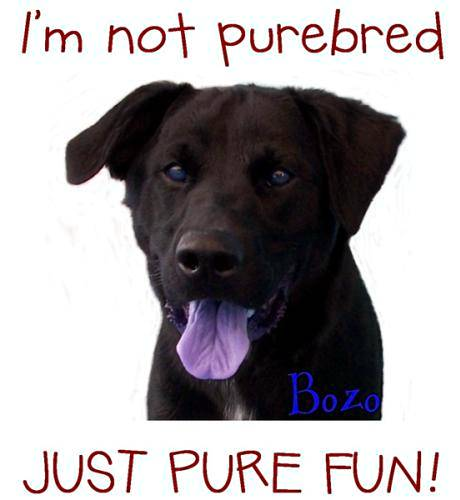

In [14]:
img_arr = cv2.imread(train[0])
img_arr

In [15]:
img_arr.shape, type(img_arr), img_arr.dtype # height, width, channel 순서

((500, 460, 3), numpy.ndarray, dtype('uint8'))

### 이미지 색상변환(BGR > RGB)

In [16]:
import matplotlib.pyplot as plt

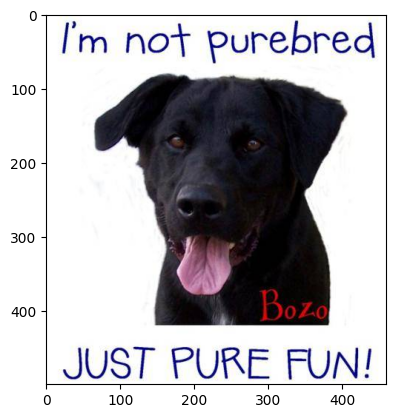

In [17]:
rgb_arr = cv2.cvtColor(img_arr, cv2.COLOR_BGR2RGB) # 변경하고자 하는 numpy 배열, img_arr은 BGR
plt.imshow(rgb_arr)
plt.show()

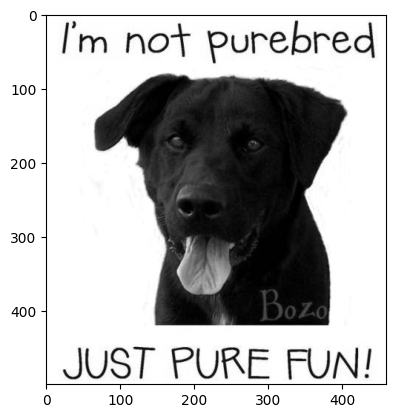

In [18]:
gray_arr = cv2.cvtColor(img_arr, cv2.COLOR_BGR2GRAY) # img_arr은 BGR
plt.imshow(gray_arr, cmap = 'gray') # cmap = 'gray' > 흑백이미지 입력
plt.show()

- 처음부터 흑백이미지 불러오기

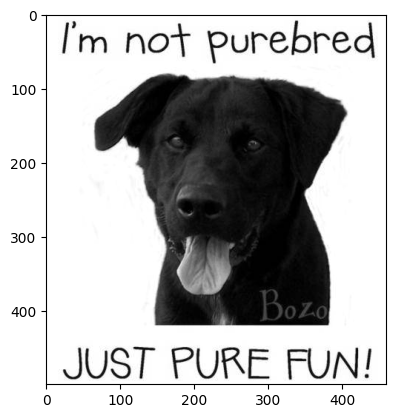

In [19]:
gray_arr = cv2.imread(train[0], cv2.IMREAD_GRAYSCALE)
plt.imshow(gray_arr, cmap = 'gray') # cmap = 'gray' > 흑백이미지 입력
plt.show()

### 이미지 저장하기

In [20]:
cv2.imwrite('gray.jpg', gray_arr)

True

### 이미지 밝기조절

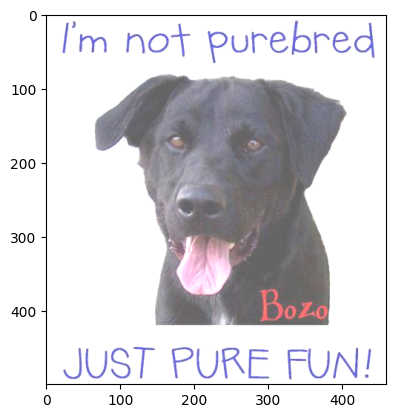

In [21]:
tmp = cv2.add(rgb_arr, (100,100,100)) # 밝기 증가
plt.imshow(tmp)
plt.show()

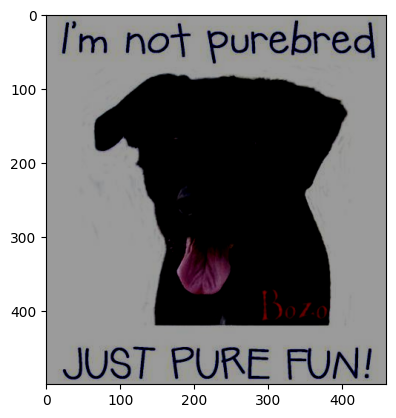

In [22]:
tmp = cv2.subtract(rgb_arr, (100,100,100)) # 밝기 감소
plt.imshow(tmp)
plt.show()

### 이미지 리사이징(resizing)
- 각기 다른 이미지의 shape 일치시키기
- cv2.resize(이미지데이터, 크기값)

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)
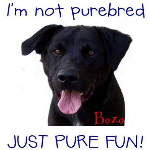

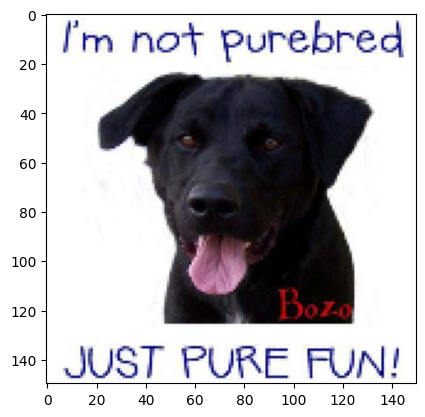

In [23]:
resize_arr = cv2.resize(rgb_arr, (150,150))
plt.imshow(resize_arr)
resize_arr

### 이미지 crop
- 이미지 외 불필요한 부분 삭제하기
- ndarray이므로 슬라이싱
  - ex) [h_min : h_max, w_min : w_max]

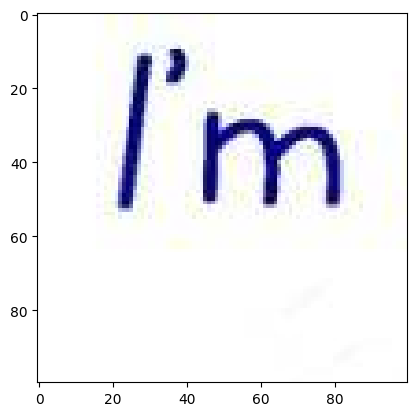

In [24]:
plt.imshow(rgb_arr[0:100, 0:100])
plt.show()

- 중앙 부분 crop하기
ex) [h_min : h_max, w_min : w_max]

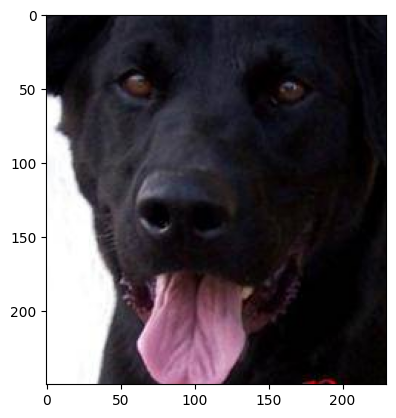

In [25]:
h_min = rgb_arr.shape[0] // 4 # 이미지의 높이 1/4 지점
w_min = rgb_arr.shape[1] // 4 # 이미지의 넓이 1/4 지점

plt.imshow(rgb_arr[h_min : h_min*3, w_min : w_min * 3]) # 1/4지점~3/4지점까지 이미지출력
plt.show()

### 이미지 회전
- cv2.rotate(이미지데이터, 출력지점)

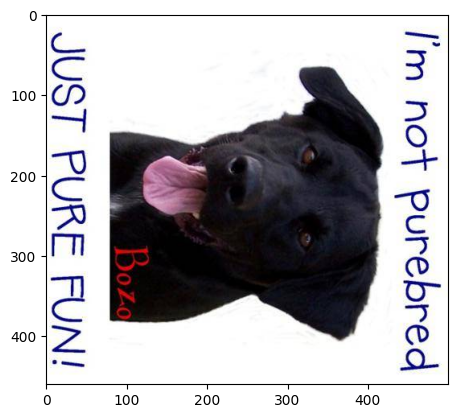

In [26]:
tmp = cv2.rotate(rgb_arr, cv2.ROTATE_90_CLOCKWISE)
plt.imshow(tmp)
plt.show()

### 이미지 색상반전
- cv2.bitwise_not(이미지데이터)

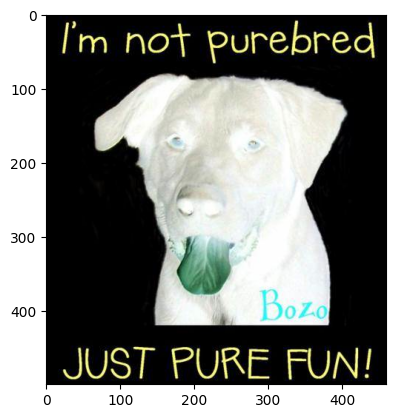

In [27]:
tmp = cv2.bitwise_not(rgb_arr)
plt.imshow(tmp)
plt.show()

### 이미지 상하+좌우 반전
- cv2.flip(rgb_arr, )
  - 두 번째 인수 0: 상하
  - 두 번째 인수 1: 좌우

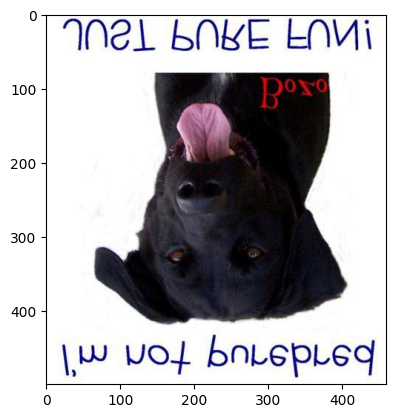

In [28]:
tmp = cv2.flip(rgb_arr, 0) # 상하 반전
plt.imshow(tmp)
plt.show()

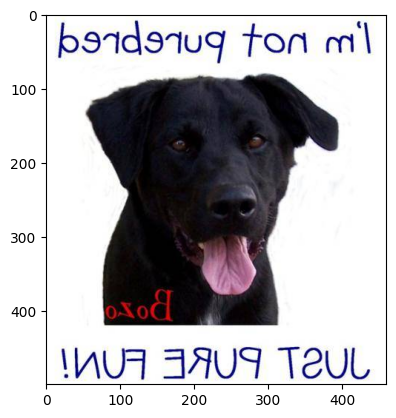

In [29]:
tmp = cv2.flip(rgb_arr, 1) # 좌우 반전
plt.imshow(tmp)
plt.show()

## pillow
- 이미지 분석 및 처리를 해주는 라이브러리
- pytorch와 호환성이 좋음

In [30]:
from PIL import Image

### 읽기오기
- open 함수사용
  - pillow 모듈의 이미지 객체 반환
  - RGB 순서 반환

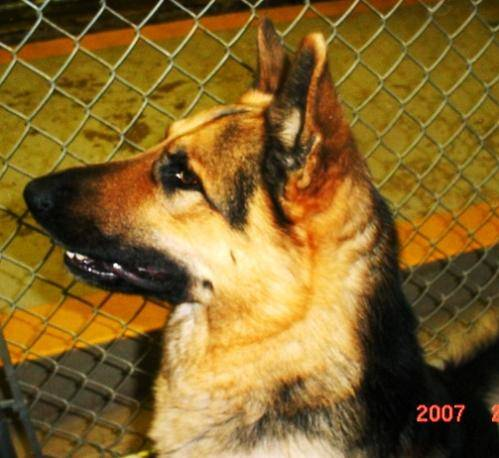

In [31]:
pil_img = Image.open(train[1004])
pil_img

- ndarray 변환

In [32]:
arr = np.array(pil_img)
arr.shape, arr.dtype

((458, 499, 3), dtype('uint8'))

- ndarray to pil 이미지 객체 변환

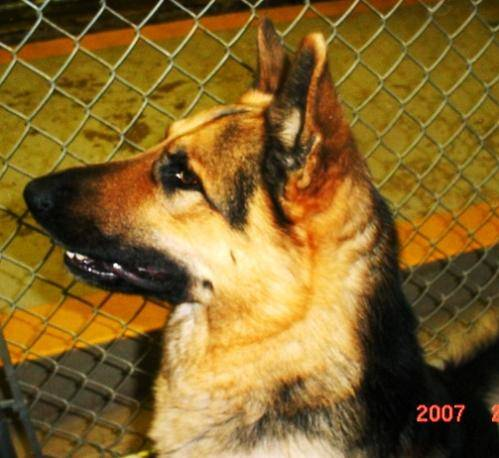

In [33]:
Image.fromarray(arr)

### 이미지 리사이징(resizing)
- resize()

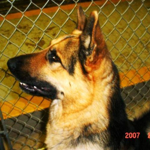

In [34]:
pil_img.resize([150,150])

### 이미지 crop
- crop메서드 사용
  - 인수로 좌표값 전달 > [w시작, h시작, w종료, h종료]

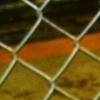

In [35]:
pil_img.crop([0,0,100,100])

- 중앙 crop하기

In [36]:
h_max, w_max, _ = np.array(pil_img).shape
h_max, w_max

(458, 499)

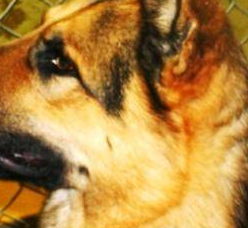

In [37]:
xy = [w_max // 4, h_max // 4, w_max // 4 * 3, h_max // 4 * 3] # w, h 순서
pil_img.crop(xy)

### 이미지 회전

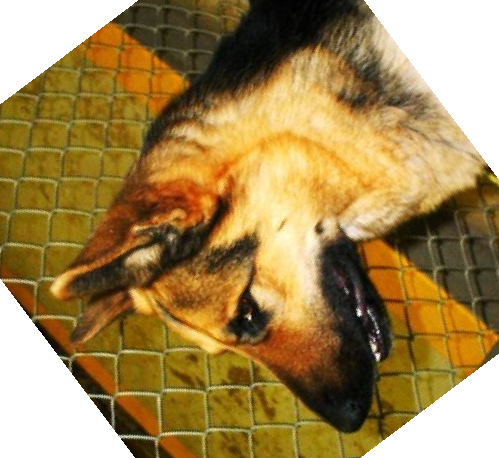

In [38]:
pil_img.rotate(127, fillcolor = (255,255,255))

### grayscale 변환

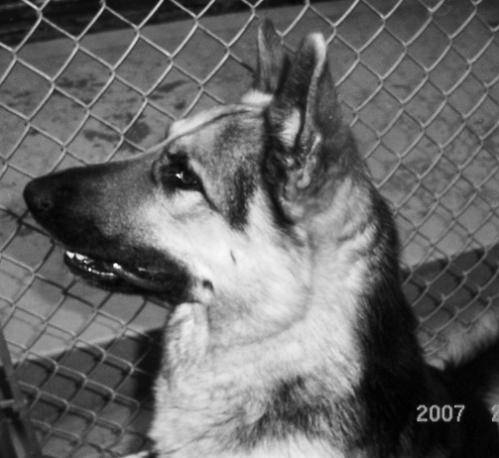

In [39]:
from PIL import ImageOps
ImageOps.grayscale(pil_img)

### 이미지 히스토그램 균등화
- 픽셀 빈도수따라
- 밝은 곳은 더 밝게, 어두운 곳은 더 어둡게

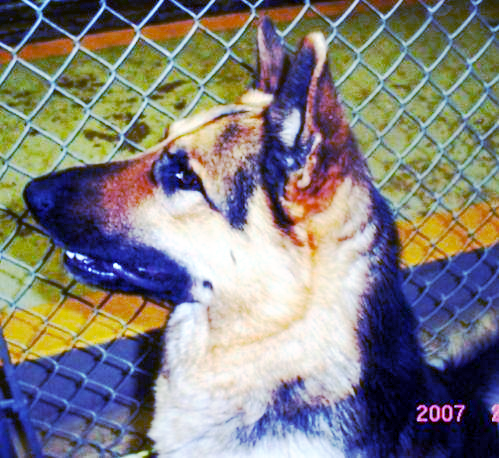

In [40]:
ImageOps.equalize(pil_img)

### 이미지 색상 반전

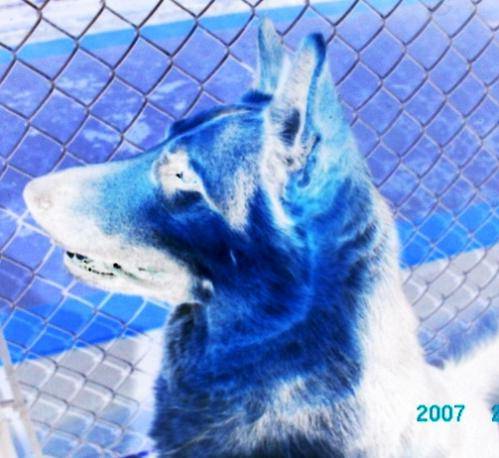

In [41]:
ImageOps.invert(pil_img)

### 이미지 좌우 반전

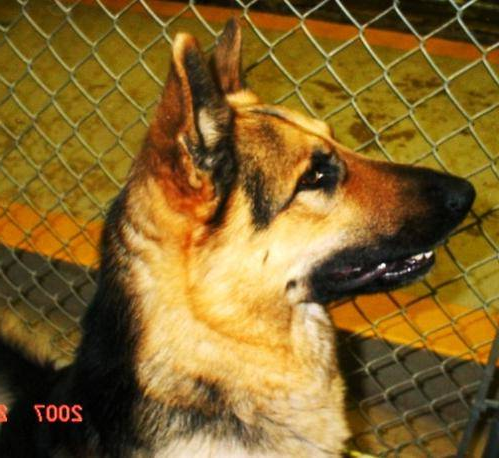

In [42]:
ImageOps.mirror(pil_img)

### 이미지 상하 반전

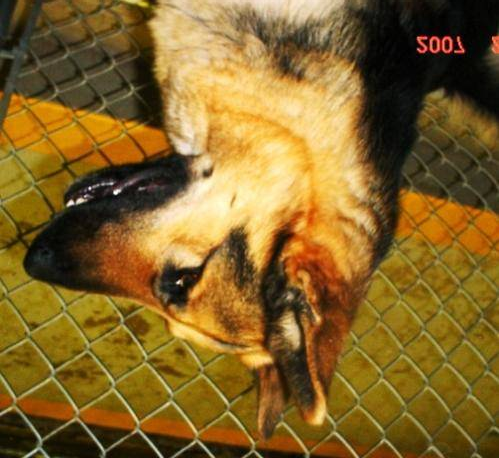

In [43]:
ImageOps.flip(pil_img)

### 이미지 포스터화
- bits 파라미터
  - 수치값 0~8 전달, 낮을수록 포스터화 강화

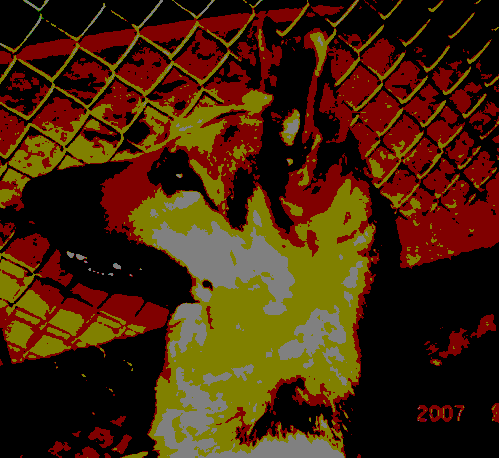

In [44]:
ImageOps.posterize(pil_img, bits = 1) # bits 강도 주기

### ImageEnhance모듈
- ImageEnhance 모듈의 클래스들을 공통적으로 pillow 이미지 객체 전달받음
- ImageEnhance 모듈의 클래스 객체들은 enhance메서드를 이용해 이미지에 효과 부여
  - 첫 번째 인수값 : 1미만 > 효과 강도 미약, 1이상 > 강화

### 이미지 밝기조절
- Brightness()
- enhance()
  - 밝음: 1 이상
  - 어두움: 1 미만

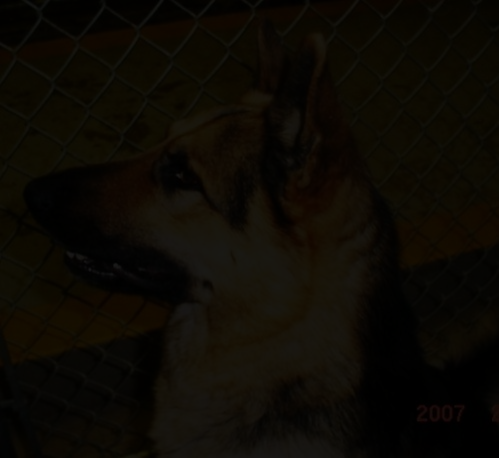

In [45]:
from PIL import ImageEnhance

eh_obj = ImageEnhance.Brightness(pil_img)
eh_obj.enhance(0.1)

### 이미지 채도
- Color()
- enhance()
  - 진함: 1 이상
  - 묽음: 1 미만

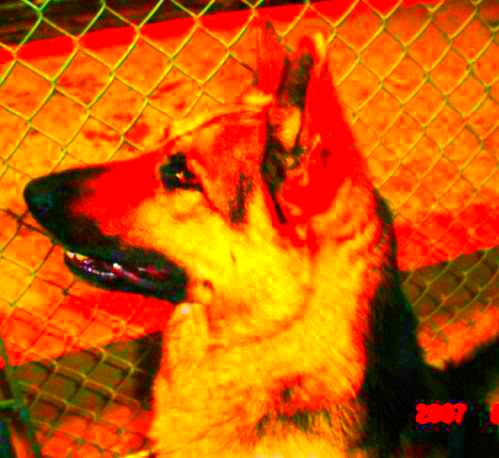

In [46]:
eh_obj = ImageEnhance.Color(pil_img)
eh_obj.enhance(7)

### 이미지 샤프닝
- Sharpness()
- enhance()
  - 선명: 1 이상
  - 흐림: 1 미만

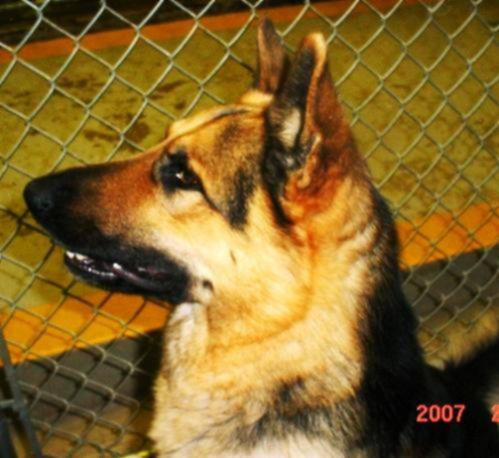

In [47]:
eh_obj = ImageEnhance.Sharpness(pil_img)
eh_obj.enhance(0.0000001)

### 이미지 명암대비
- Contrast()
- enhance()
  - 증가: 1 이상
  - 감소: 1 미만


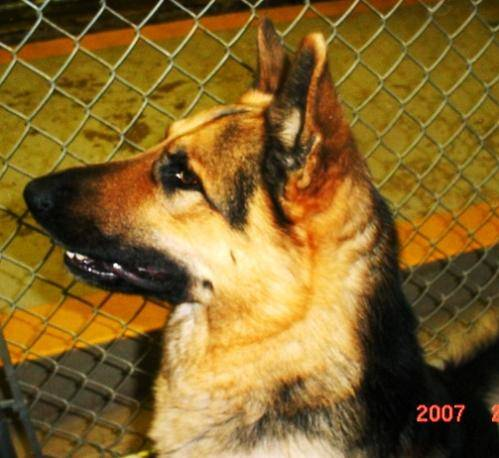

In [48]:
eh_obj = ImageEnhance.Contrast(pil_img)
eh_obj.enhance(1)

### 이미지필터 모듈
- 클래스에 인수 전달
  - 첫 번째 인수값: 0보다 큰수 전달

- 전달한 인수 값 클수록 효과 증가

In [49]:
from PIL import ImageFilter

### 이미지블러 효과

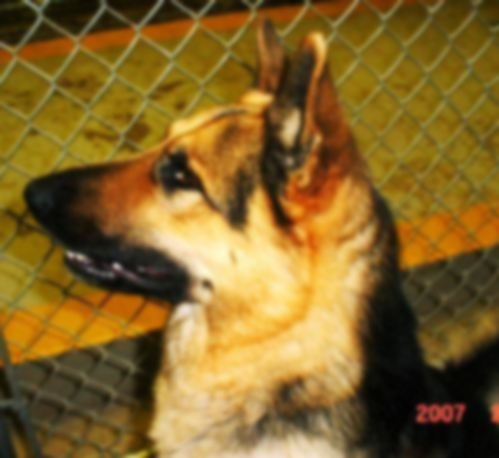

In [50]:
f_obj = ImageFilter.GaussianBlur(2)
pil_img.filter(f_obj)

### 이미지 흑백윤곽선

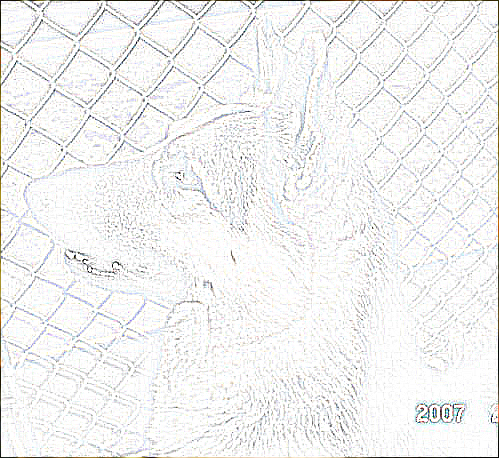

In [51]:
f_obj = ImageFilter.CONTOUR
pil_img.filter(f_obj)

### 이미지 디테일

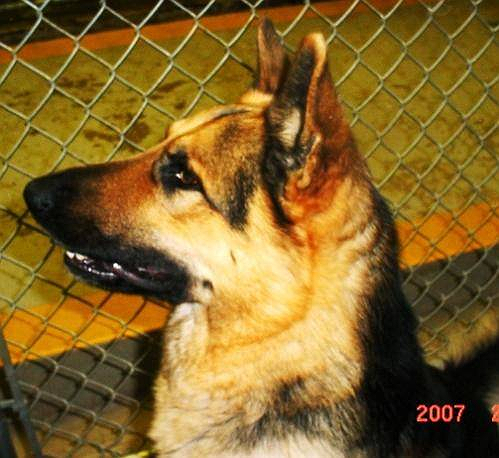

In [52]:
f_obj = ImageFilter.DETAIL
pil_img.filter(f_obj)

### 이미지 엣지강조

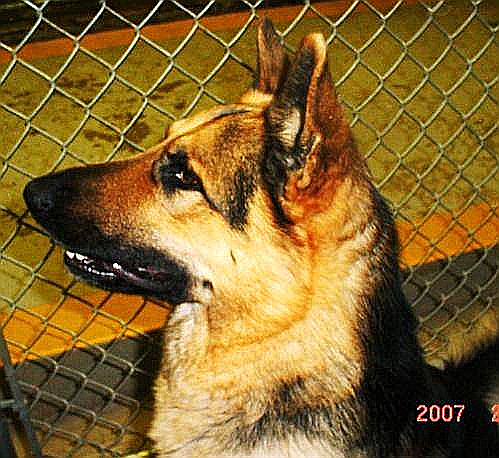

In [53]:
f_obj = ImageFilter.EDGE_ENHANCE
pil_img.filter(f_obj)

### 이미지 저장하기

In [54]:
pil_img.save('ldk.jpg')

# 데이터셋 클래스 구현

In [55]:
train

array(['train/dogs/dog.900.jpg', 'train/dogs/dog.314.jpg',
       'train/cats/cat.232.jpg', ..., 'train/dogs/dog.59.jpg',
       'train/cats/cat.169.jpg', 'train/dogs/dog.54.jpg'], dtype='<U22')

In [56]:
target = target.reshape(-1,1)
target

array([[1],
       [1],
       [0],
       ...,
       [1],
       [0],
       [1]])

In [57]:
class CatDogDatatest(torch.utils.data.Dataset):
  def __init__(self, x, y=None, resize = (150,150)):
    self.x = x
    self.y = y
    self.resize = resize

  def __len__(self):
    return len(self.x)

  def __getitem__(self, idx):
    item = {}
    x = cv2.imread(self.x[idx]) # 이미지를 numpy배열로 변환
    x = cv2.cvtColor(x, cv2.COLOR_BGR2RGB) # x의 순서 BGR > RGB로 변경
    x = cv2.resize(x, self.resize) # 리사이징 필수 > 일반적으로 150 x 150
    x = x / 255 # 스케일링 만들기

    item['x'] = torch.Tensor(x)

    if self.y is not None:
      item['y'] = torch.Tensor(self.y[idx])
    return item

- 결과 확인하기

In [58]:
dt = CatDogDatatest(train, target) # x = x / 255없는 경우, 스케일링이 안된 값으로 반환
dt[0]

{'x': tensor([[[1., 1., 1.],
          [1., 1., 1.],
          [1., 1., 1.],
          ...,
          [1., 1., 1.],
          [1., 1., 1.],
          [1., 1., 1.]],
 
         [[1., 1., 1.],
          [1., 1., 1.],
          [1., 1., 1.],
          ...,
          [1., 1., 1.],
          [1., 1., 1.],
          [1., 1., 1.]],
 
         [[1., 1., 1.],
          [1., 1., 1.],
          [1., 1., 1.],
          ...,
          [1., 1., 1.],
          [1., 1., 1.],
          [1., 1., 1.]],
 
         ...,
 
         [[1., 1., 1.],
          [1., 1., 1.],
          [1., 1., 1.],
          ...,
          [1., 1., 1.],
          [1., 1., 1.],
          [1., 1., 1.]],
 
         [[1., 1., 1.],
          [1., 1., 1.],
          [1., 1., 1.],
          ...,
          [1., 1., 1.],
          [1., 1., 1.],
          [1., 1., 1.]],
 
         [[1., 1., 1.],
          [1., 1., 1.],
          [1., 1., 1.],
          ...,
          [1., 1., 1.],
          [1., 1., 1.],
          [1., 1., 1.]]]),
 'y': t

In [59]:
dl = torch.utils.data.DataLoader(dt, batch_size = 1, shuffle = False)
batch = next(iter(dl)) # batch, height, width, channel > 이미지데이터이므로 4차원
batch

{'x': tensor([[[[1., 1., 1.],
           [1., 1., 1.],
           [1., 1., 1.],
           ...,
           [1., 1., 1.],
           [1., 1., 1.],
           [1., 1., 1.]],
 
          [[1., 1., 1.],
           [1., 1., 1.],
           [1., 1., 1.],
           ...,
           [1., 1., 1.],
           [1., 1., 1.],
           [1., 1., 1.]],
 
          [[1., 1., 1.],
           [1., 1., 1.],
           [1., 1., 1.],
           ...,
           [1., 1., 1.],
           [1., 1., 1.],
           [1., 1., 1.]],
 
          ...,
 
          [[1., 1., 1.],
           [1., 1., 1.],
           [1., 1., 1.],
           ...,
           [1., 1., 1.],
           [1., 1., 1.],
           [1., 1., 1.]],
 
          [[1., 1., 1.],
           [1., 1., 1.],
           [1., 1., 1.],
           ...,
           [1., 1., 1.],
           [1., 1., 1.],
           [1., 1., 1.]],
 
          [[1., 1., 1.],
           [1., 1., 1.],
           [1., 1., 1.],
           ...,
           [1., 1., 1.],
           [1., 1

In [60]:
batch['x'].shape

torch.Size([1, 150, 150, 3])

## conv2d 클래스
- in_channels: input의 feature dimension(채널 개수)
- out_channels: output의 feature dimension(채널개수)
- kernel(filter)_size: 필터 크기 > 스칼라값 n전달에 따라 n x n형태
- stride: kernel을 얼마만큼씩 이동하면서 적용할 것인가 (Default: 1)
- padding: 얼마만큼 padding할 것인가 (Default: 0)
- 입력 텐서 shape > 필수 지켜야할 것
    - Batch,channel, height, width

In [61]:
# batch, width, height, channel > Batch, channel, width, height
x = batch['x'].permute(0,3,1,2) # 입력텐서 shape화
x.shape

torch.Size([1, 3, 150, 150])

In [62]:
conv2d = torch.nn.Conv2d(3, 6, 5) # 입력피처개수, 출력피처개수, 커널개수
x = conv2d(x)
x.shape # batch, channel, width, height > channel의 수는 증가, width, height의 수는 감소

torch.Size([1, 6, 146, 146])

## MaxPool2d 클래스
- 최대값 풀링
- 첫 번째 파라미터가 커널사이즈 의미
  - stride 파라미터 생략 시 커널사이즈에 전달

In [63]:
pool2d = torch.nn.MaxPool2d(2) # 2칸씩 이동
pool2d(x).shape

torch.Size([1, 6, 73, 73])

## AvgPool2d 클래스
- 평균 풀링

In [64]:
pool2d = torch.nn.AvgPool2d(2) # 2칸씩 이동
x = pool2d(x)
x.shape

torch.Size([1, 6, 73, 73])

## Global Pooling

In [65]:
gl_pool2d = torch.nn.AdaptiveMaxPool2d(1) # batch, channel, 1(width),1(height) > 평평하게 만들기 위해 (1)
cnn_output = gl_pool2d(x)
cnn_output.shape

torch.Size([1, 6, 1, 1])

In [66]:
# b, c, h, w > b, c * h * w
flatten = torch.nn.Flatten()
flatten(cnn_output).shape # 1, 6 * 1 * 1

torch.Size([1, 6])

# 신경망 모델클래스 구현

In [67]:
batch['x'].shape[3] # 채널 수

3

- 변경 전

In [68]:
# class Net(torch.nn.Module):
#   def __init__(self, in_channels= 3, out_channels = 16, kernel_size = 3):
#     super().__init__()
#     self.seq = torch.nn.Sequential(
#         torch.nn.Conv2d(in_channels, out_channels, kernel_size),
#         torch.nn.LeakyReLU(), # 음수값 고려
#         torch.nn.MaxPool2d(2),
#         torch.nn.Conv2d(out_channels, out_channels * 2, kernel_size),
#         torch.nn.LeakyReLU(),
#         torch.nn.MaxPool2d(2),

#         torch.nn.AdaptiveAvgPool2d(1), # batch, channel, 1, 1
#         torch.nn.Flatten(), # batch, channel, 1, 1 > batch, channel
#         torch.nn.Linear(out_channels * 2, 1) # 입력 피처개수
#     )

#   def forward(self,x):
#     return self.seq(x.permute(0,3,1,2)) # batch, channel, height, width

- 변경 후 > custom layer 만들기

In [69]:
class Conv2dNet(torch.nn.Module):
  def __init__(self, in_channels, out_channels, kernel_size):
    super().__init__() # 부모클래스의 Module을 받기
    self.seq = torch.nn.Sequential(
        torch.nn.Conv2d(in_channels, out_channels, kernel_size),
        torch.nn.BatchNorm2d(out_channels),
        torch.nn.LeakyReLU(),
        torch.nn.MaxPool2d(2)
    )

  def forward(self,x):
    return self.seq(x)

In [70]:
class Net(torch.nn.Module):
  def __init__(self, in_channels= 3, out_channels= 16, kernel_size= 3):
    super().__init__()
    self.seq = torch.nn.Sequential(
        Conv2dNet(in_channels, out_channels, kernel_size),
        Conv2dNet(out_channels, out_channels * 2, kernel_size),
        Conv2dNet(out_channels * 2, out_channels * 4, kernel_size),
        Conv2dNet(out_channels * 4, out_channels * 8, kernel_size),
        torch.nn.AdaptiveMaxPool2d(1), # batch, channel, 1, 1
        torch.nn.Flatten(), # batch, channel, 1, 1 > batch, channel
        torch.nn.Dropout(0.2),
        torch.nn.Linear(out_channels * 8, 1)
    )

  def forward(self,x):
    x = x.permute(0,3,1,2)
    return self.seq(x)

In [71]:
model = Net()
model(batch['x'])

tensor([[-1.5294]], grad_fn=<AddmmBackward0>)

# 학습데이터 loop함수 구현

In [72]:
def train_loop(dl, model, loss_fn, optimizer, device):
  epoch_loss = 0
  model.train() # 학습모드
  for batch in dl:
    pred = model(batch['x'].to(device))
    loss = loss_fn(pred, batch['y'].to(device))

    optimizer.zero_grad() # 기울기 0초기화
    loss.backward() # 역전파
    optimizer.step() # 가중치업데이트

    epoch_loss += loss.item()
  epoch_loss /= len(dl)
  return epoch_loss

# 테스트데이터 loop함수 구현

In [73]:
@torch.no_grad()
def test_loop(dl, model, loss_fn, device):
  epoch_loss = 0
  model.eval() # 평가모드

  act = torch.nn.Sigmoid() # 회귀에서 사용 x
  pred_list = []
  for batch in dl:
    pred = model(batch['x'].to(device))
    if batch.get('y') is not None:
      loss = loss_fn(pred, batch['y'].to(device))
      epoch_loss += loss.item()

    pred = act(pred) # 회귀에서 사용 x
    pred = pred.to('cpu').numpy()
    pred_list.append(pred)

  pred = np.concatenate(pred_list)
  epoch_loss /= len(dl)
  return epoch_loss, pred

# 하이퍼파라미터 정의

In [74]:
batch_size = 32
loss_fn = torch.nn.BCEWithLogitsLoss()
epochs = 100
n_splits = 5 #kfold의 k값

# 조합 후 KFold학습 수행

In [75]:
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
cv = KFold(n_splits, random_state = SEED, shuffle = True)

In [76]:
is_holdout = False
reset_seeds(SEED)
score_list = []

for i, (tri,vai) in enumerate(cv.split(train)):
  model = Net().to(device)
  optimizer = torch.optim.Adam(model.parameters())

  # 학습데이터
  train_dt = CatDogDatatest(train[tri], target[tri])
  train_dl = torch.utils.data.DataLoader(train_dt, batch_size = batch_size, shuffle = True)

  #검증데이터
  valid_dt = CatDogDatatest(train[vai], target[vai])
  valid_dl = torch.utils.data.DataLoader(valid_dt, batch_size = batch_size, shuffle = False)

  best_score = 0
  patience = 0
  for epoch in range(epochs):
    train_loss = train_loop(train_dl, model, loss_fn, optimizer, device)
    valid_loss, pred = test_loop(valid_dl, model, loss_fn, device)
    pred = (pred > 0.5).astype(int)
    score = accuracy_score(target[vai], pred)

    print(train_loss, valid_loss, score)
    patience += 1

    if score > best_score:
      patience = 0
      best_score = score
      torch.save(model.state_dict(), f'model_{i}.pt') # 가중치만 저장

    if patience == 5:
      break
  print(f'Fold-{i}, Best_ACC : {best_score}')
  score_list.append(best_score)
  if is_holdout:
    break

0.7032944333553314 0.6362939935464126 0.65
0.611962977051735 0.704999043391301 0.6075
0.5623195517063141 0.7881810298332801 0.58
0.5322197014093399 0.6138504308003646 0.68
0.4556862407922745 0.561069653584407 0.72
0.428000990152359 0.5364211476766146 0.71
0.3713845658302307 0.6535956676189716 0.695
0.34481404691934586 0.4564983592583583 0.7725
0.2903426030278206 0.48158758649459255 0.77
0.2999742889404297 0.6808655972664173 0.675
0.2719912698864937 0.5958552429309258 0.7375
0.20069198966026305 0.47573860792013317 0.76
0.18563847973942757 0.5327265560626984 0.75
Fold-0, Best_ACC : 0.7725
0.7276558780670166 0.6717870418842022 0.605
0.6505010539293289 0.6034405873372004 0.6925
0.578967787027359 0.6391235085634085 0.6275
0.5434007376432419 0.5681481407238886 0.69
0.4819741308689117 0.9705507709429815 0.545
0.43891755282878875 0.5489101730860196 0.7325
0.3970819503068924 0.5099081649230077 0.75
0.36792864590883256 0.5275416649304904 0.7425
0.3231726664304733 0.5012502280565408 0.77
0.310618

In [77]:
score_list

[0.7725, 0.7825, 0.8475, 0.7975, 0.845]